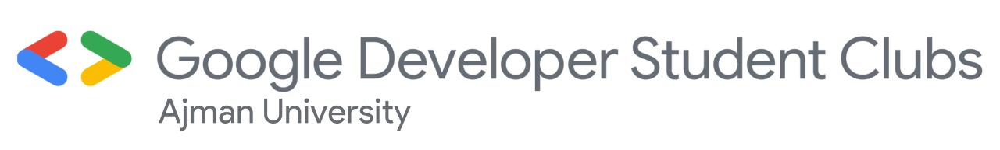
<center>

# **Data Science Project Workshop**
</p></center>

January 2023

Done by the Google Developers Students Club members:
- Abdulrahman Sobeih
- Maryam Almetnawy
---

##Dataset Background 


This supermarket dataset is a collection of data that provides information about the transactions that took place in a supermarket. This dataset typically includes information such as the date and time of the transaction, the products that were purchased, the price of each product, the total amount spent on the transaction, and other relevant details.

We will use this dataset to perform data analysis and gain insights into the behavior of the supermarket customers. For example, we might use this supermarket dataset to study the relationship between the day of the week and the total amount spent on transactions, or to analyze the factors that influence customer spending patterns. We might also use this dataset to identify trends and patterns in customer behavior, to optimize pricing and product placement, or to develop marketing and advertising strategies.

Overall, this supermarket dataset can be a valuable tool for understanding and predicting the behavior of supermarket customers, and for making data-driven decisions that can improve the performance of a supermarket business.

**Dataset to use:** https://www.kaggle.com/datasets/aungpyaeap/supermarket-sales

Business questions to answer:
1. What are the most popular items purchased at the supermarket?
2. What is the average purchase amount for customers of each type?
3. How does the supermarket's sales vary by day of the week or time of year?
4. How does the total price of a product vary with the tax?
5. What is the best time for purchasing products?

 

##Data Description

Invoice id: Computer generated sales slip invoice identification number

Branch: Branch of supercenter (3 branches are available identified by A, B and C).

City: Location of supercenters

Customer type: Type of customers, recorded by Members for customers using member card and Normal for without member card.

Gender: Gender type of customer

Product line: General item categorization groups - Electronic accessories, Fashion accessories, Food and beverages, Health and beauty, Home and lifestyle, Sports and travel

Unit price: Price of each product in $

Quantity: Number of products purchased by customer

Tax: 5% tax fee for customer buying

Total: Total price including tax

Date: Date of purchase (Record available from January 2019 to March 2019)

Time: Purchase time (10am to 9pm)

Payment: Payment used by customer for purchase (3 methods are available – Cash, Credit card and Ewallet)

COGS: Cost of goods sold

Gross margin percentage: Gross margin percentage

Gross income: Gross income

Rating: Customer stratification rating on their overall shopping experience (On a scale of 1 to 10)

In [1]:
from google.colab import drive 
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#uninstalling pandas-profiling
!pip uninstall pandas-profiling

In [ ]:
!pip install pandas-profiling[notebook,htm1]

In [2]:
#Some imports
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

In [3]:
df = pd.read_csv('/content/drive/MyDrive/supermarket_sales - Sheet1.csv')
df

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233-67-5758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,1/29/2019,13:46,Ewallet,40.35,4.761905,2.0175,6.2
996,303-96-2227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,3/2/2019,17:16,Ewallet,973.80,4.761905,48.6900,4.4
997,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,2/9/2019,13:22,Cash,31.84,4.761905,1.5920,7.7
998,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,2/22/2019,15:33,Cash,65.82,4.761905,3.2910,4.1


In [4]:
df_c = df.copy()
df_original = df.copy()


# **Data Profiling / Exploration**

*   Analyzing the data to identify errors and missing data.
*   Collecting descriptive statistics.
*   Knowing the data types.
*   Performing data quality assessments.
*   Looking for risks of performing joins on the data.
*   Identifying inconsistencies in the format

In [5]:
df.info()
#no missing values
#different types of data types
#low amount of data 
#17 different attributes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Invoice ID               1000 non-null   object 
 1   Branch                   1000 non-null   object 
 2   City                     1000 non-null   object 
 3   Customer type            1000 non-null   object 
 4   Gender                   1000 non-null   object 
 5   Product line             1000 non-null   object 
 6   Unit price               1000 non-null   float64
 7   Quantity                 1000 non-null   int64  
 8   Tax 5%                   1000 non-null   float64
 9   Total                    1000 non-null   float64
 10  Date                     1000 non-null   object 
 11  Time                     1000 non-null   object 
 12  Payment                  1000 non-null   object 
 13  cogs                     1000 non-null   float64
 14  gross margin percentage  

In [6]:
df.isnull().sum() #another way to check for outliers

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

In [7]:
df.describe() # checking for outliers and statistical values

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000


Reasons we might have duplicates:
- joins / merging data
- data aggregation
- human typing errors

In [8]:
df.duplicated().sum() #checking number of duplicates 

0

In [9]:
df.nunique() #checking the number of unique values in each attribute

Invoice ID                 1000
Branch                        3
City                          3
Customer type                 2
Gender                        2
Product line                  6
Unit price                  943
Quantity                     10
Tax 5%                      990
Total                       990
Date                         89
Time                        506
Payment                       3
cogs                        990
gross margin percentage       1
gross income                990
Rating                       61
dtype: int64

In [10]:
df['gross margin percentage'].unique()

array([4.76190476])

In [11]:
df['Customer type'].unique() #using this method we can know what the unqiue values are

array(['Member', 'Normal'], dtype=object)

In [12]:
df['Payment'].unique()

array(['Ewallet', 'Cash', 'Credit card'], dtype=object)

In [13]:
# dropping the gross margin and id since they're useless attributes:
df = df.drop(columns=['Invoice ID','gross margin percentage'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Branch         1000 non-null   object 
 1   City           1000 non-null   object 
 2   Customer type  1000 non-null   object 
 3   Gender         1000 non-null   object 
 4   Product line   1000 non-null   object 
 5   Unit price     1000 non-null   float64
 6   Quantity       1000 non-null   int64  
 7   Tax 5%         1000 non-null   float64
 8   Total          1000 non-null   float64
 9   Date           1000 non-null   object 
 10  Time           1000 non-null   object 
 11  Payment        1000 non-null   object 
 12  cogs           1000 non-null   float64
 13  gross income   1000 non-null   float64
 14  Rating         1000 non-null   float64
dtypes: float64(6), int64(1), object(8)
memory usage: 117.3+ KB


Another way to explore the data is using visualizations:
- Pie charts
- Bar charts
- Scatter plots 
- heatmaps

Text(0.5, 1.0, 'Supermarket sales in each city')

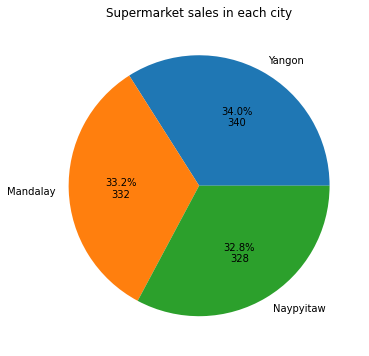

In [14]:
total = df['City'].value_counts().values.sum() #Cities in Myanmar
def fmt(x):
    return '{:.1f}%\n{:.0f}'.format(x, total*x/100)

plt.figure(figsize=(6,6))
plt.pie(df['City'].value_counts().values, labels=df['City'].value_counts().index, autopct=fmt)
plt.title('Supermarket sales in each city')

In [15]:
import plotly.express as px #another way is to use plotly library
fig = px.pie(df, values='Total', names='Product line') #getting the total price percentage of each product category
fig.show()

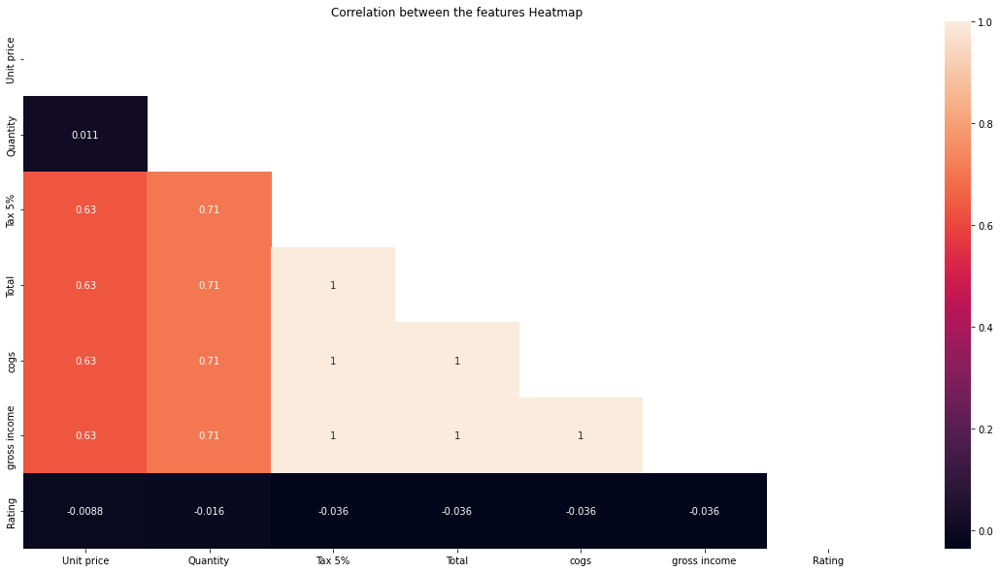

In [16]:
plt.figure(figsize=(20, 10)) # shows the correlation between the attributes
mask = np.triu((df.corr())) # returns the triangle upper array of the heatmap
heatmap = sns.heatmap(df.corr(), mask=mask, annot=True)
heatmap.set_title('Correlation between the features Heatmap');

### We can use some libraries that allow us to get a full and well-rounded overview of the dataset which helps us go through the dataset and explore it with less work and more faster results. Check out the data profiling overview of the dataset:


In [19]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport 
from pandas_profiling.utils.cache import cache_file

In [20]:
profile = ProfileReport (df)
profile.to_notebook_iframe ()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Answering the business questions

**1. What are the most popular items purchased at the supermarket?**

This code will group the data by the 'product line' column, and calculate the total quantity sold for each product line. It will then sort the product lines by the total quantity sold in descending order and select the top 10 most popular product lines. Finally, it will create a bar chart using these values and add a title and axis labels.

In [21]:
# Group the data by the 'product line' column and calculate the total quantity sold for each product line
product_line_sales = df.groupby('Product line')['Quantity'].sum()

# Sort the product lines by the total quantity sold in descending order
most_popular_items = product_line_sales.sort_values(ascending=False)

# Print the top 10 most popular product lines
print(most_popular_items.head(10))


Product line
Electronic accessories    971
Food and beverages        952
Sports and travel         920
Home and lifestyle        911
Fashion accessories       902
Health and beauty         854
Name: Quantity, dtype: int64


As seen below, Electronic accessories + food and beverages + sports and travel are the top 3 most sold products

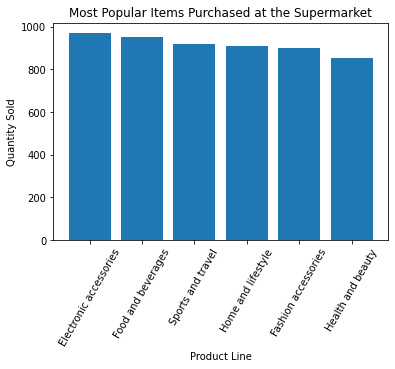

In [22]:
# Create a bar chart
plt.bar(most_popular_items.index, most_popular_items.values)

# Add a title and axis labels
plt.title('Most Popular Items Purchased at the Supermarket')
plt.xlabel('Product Line')
plt.xticks(rotation=60) 
plt.ylabel('Quantity Sold')

# Display the chart
plt.show()

**2. What is the average purchase amount for customers of each type?**

This code will group the data by the 'customer type' column, and calculate the average total price for each customer type. It will then print the resulting Series.

In [23]:
# Group the data by the 'customer type' column and calculate the average total price for each customer type
avg_purchase_amount = df.groupby('Customer type')['Total'].mean()

# Print the average purchase amount for each customer type
print(avg_purchase_amount)

Customer type
Member    327.791305
Normal    318.122856
Name: Total, dtype: float64


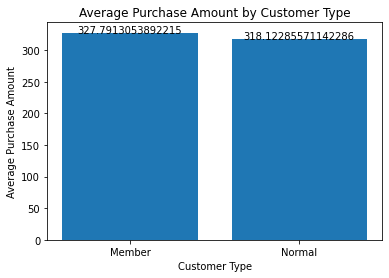

In [24]:
# Create a bar chart
plt.bar(avg_purchase_amount.index, avg_purchase_amount.values)

# Add a title and axis labels
plt.title('Average Purchase Amount by Customer Type')
plt.xlabel('Customer Type')
plt.ylabel('Average Purchase Amount')
# Add the average purchase amount values on top of the bars
for i, v in enumerate(avg_purchase_amount.values):
    plt.text(i, v, str(v), ha='center')
# Display the chart
plt.show() # there are more customers that use supermarket member cards than without

In [25]:
fig = px.pie(df, values='Total', names='Customer type') #another way is to use plotly libraries
fig.show()

**3. How does the supermarket's sales vary by day of the week or time of year?**

On saturdays and tuesdays there are more sales than usual, while mondays have the least sales, so maybe to increase sales on monday we can have discounts or promotions to attract customers.

In [26]:
# Convert the 'date' column to a datetime data type
df['Date'] = pd.to_datetime(df['Date'])
df.head(2)

,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross income,Rating
0,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08,Ewallet,522.83,26.1415,9.1
1,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29,Cash,76.40,3.8200,9.6


In [27]:
# Create a new column with the day of the week
df['day_of_week'] = df['Date'].dt.day_name()

# Group the data by the 'day_of_week' column and calculate the total sales for each day of the week
sales_by_day = df.groupby('day_of_week')['gross income'].sum()
sales_by_day

day_of_week
Friday       2091.7305
Monday       1804.7180
Saturday     2672.4195
Sunday       2117.0425
Thursday     2159.4880
Tuesday      2451.5355
Wednesday    2082.4350
Name: gross income, dtype: float64

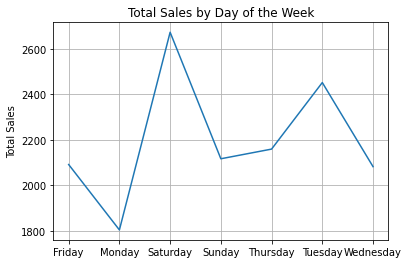

In [28]:
# Plot the total sales for each day of the week
plt.plot(sales_by_day.index, sales_by_day.values)

# Add a title and y-axis label
plt.title('Total Sales by Day of the Week')
plt.ylabel('Total Sales')

# Display the chart
plt.grid()
plt.show()

In [29]:
# Create a new column with the month of the year
df['month'] = df['Date'].dt.month_name()

df['month']


0       January
1         March
2         March
3       January
4      February
         ...   
995     January
996       March
997    February
998    February
999    February
Name: month, Length: 1000, dtype: object

In [30]:
# Group the data by the 'month' column and calculate the total sales for each month
sales_by_month = df.groupby('month')['gross income'].sum()
sales_by_month

month
February    4629.494
January     5537.708
March       5212.167
Name: gross income, dtype: float64

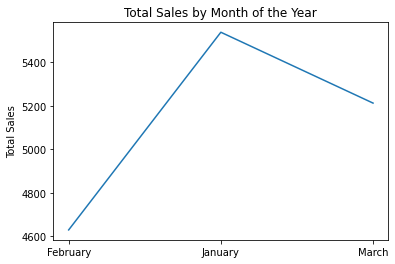

In [31]:
# Plot the total sales for each month
plt.plot(sales_by_month.index, sales_by_month.values)

# Add a title and y-axis label
plt.title('Total Sales by Month of the Year')
plt.ylabel('Total Sales')

# Display the chart
plt.show()

**4. How does the total price of a product vary with the tax?**

Scatter plots are helpful to see the relationship between 2 numerical features, as seen below, the relationship between the tax and total price of a product is proportional. As the total price increases, the tax also tends to increase.

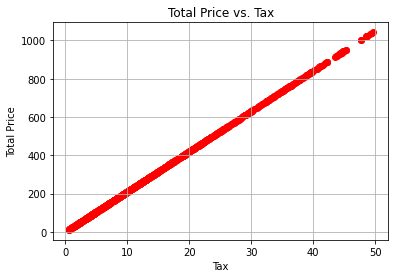

In [32]:
# Create a scatter plot with the unit price on the x-axis and the total price on the y-axis
plt.scatter(df['Tax 5%'], df['Total'], color= 'red')

# Add a title and axis labels
plt.title('Total Price vs. Tax')
plt.xlabel('Tax')
plt.ylabel('Total Price')

# Display the chart
plt.grid()
plt.show()


**5. What time is the best for purchasing products?**

7pm seems to be the best time for purchasing products since it has a large number of order sold that time, according to the graph, 5pm had the lowest number or orders that time

In [33]:
# Convert the 'time' column to a datetime data type
df['Time'] = pd.to_datetime(df['Time'])
df.head(2)

df['Hour'] = df['Time'].dt.hour
df['Minutes'] = df['Time'].dt.minute
df.head(2)

,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross income,Rating,day_of_week,month,Hour,Minutes
0,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,2023-01-11 13:08:00,Ewallet,522.83,26.1415,9.1,Saturday,January,13,8
1,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,2023-01-11 10:29:00,Cash,76.40,3.8200,9.6,Friday,March,10,29


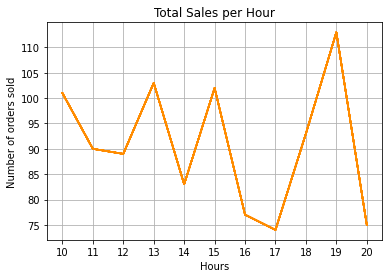

In [34]:
hours = [hour for hour, df in df.groupby('Hour')]
# grouping and counting the rows by hour
plt.plot(hours,df.groupby(['Hour']).count(), color = 'darkorange')
plt.xticks(hours)
plt.xlabel('Hours')
plt.ylabel('Number of orders sold')
plt.title('Total Sales per Hour')
plt.grid()
plt.show()

In [35]:
products = df.groupby('Product line')
Quantity = products.sum()['Quantity']
products = [product for product, df in products ]

In [36]:
prices = df.groupby('Product line').mean()['Unit price']

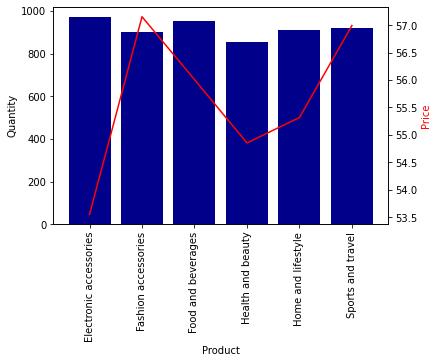

In [37]:
fig, ax = plt.subplots()
ax2 = ax.twinx()
ax.bar(products,Quantity,color = 'darkblue')
ax2.plot(products,prices,color = 'red')

ax.set_xlabel('Product')
ax.set_ylabel('Quantity') 
ax.set_xticklabels(products, rotation ='vertical',size = 10 )
ax2.set_ylabel('Price',color = 'red')
plt.show()

# Machine Learning (Regression)
### Predicting the weekly gross income of the supermarket

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Branch         1000 non-null   object        
 1   City           1000 non-null   object        
 2   Customer type  1000 non-null   object        
 3   Gender         1000 non-null   object        
 4   Product line   1000 non-null   object        
 5   Unit price     1000 non-null   float64       
 6   Quantity       1000 non-null   int64         
 7   Tax 5%         1000 non-null   float64       
 8   Total          1000 non-null   float64       
 9   Date           1000 non-null   datetime64[ns]
 10  Time           1000 non-null   datetime64[ns]
 11  Payment        1000 non-null   object        
 12  cogs           1000 non-null   float64       
 13  gross income   1000 non-null   float64       
 14  Rating         1000 non-null   float64       
 15  day_of_week    1000 no

In [39]:
# drop some unnecessary columns
df.drop(["Branch","month", "Hour", "Minutes","Time","day_of_week"], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   City           1000 non-null   object        
 1   Customer type  1000 non-null   object        
 2   Gender         1000 non-null   object        
 3   Product line   1000 non-null   object        
 4   Unit price     1000 non-null   float64       
 5   Quantity       1000 non-null   int64         
 6   Tax 5%         1000 non-null   float64       
 7   Total          1000 non-null   float64       
 8   Date           1000 non-null   datetime64[ns]
 9   Payment        1000 non-null   object        
 10  cogs           1000 non-null   float64       
 11  gross income   1000 non-null   float64       
 12  Rating         1000 non-null   float64       
dtypes: datetime64[ns](1), float64(6), int64(1), object(5)
memory usage: 101.7+ KB


In [40]:
# Setting the data column as an index
df = df.set_index('Date')
df.head()

,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Payment,cogs,gross income,Rating
Date,,,,,,,,,,,,
2019-01-05,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,Ewallet,522.83,26.1415,9.1
2019-03-08,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,Cash,76.40,3.8200,9.6
2019-03-03,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,Credit card,324.31,16.2155,7.4
2019-01-27,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,Ewallet,465.76,23.2880,8.4
2019-02-08,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,Ewallet,604.17,30.2085,5.3


In [41]:
#Finding the average sales for each month 
df_weekly = df[(df.columns).tolist()].resample('W').mean()
df_weekly

,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating
Date,,,,,,,
2019-01-06,55.980909,5.545455,15.189082,318.970718,303.781636,15.189082,7.167273
2019-01-13,53.810685,5.904110,15.956425,335.084918,319.128493,15.956425,6.756164
2019-01-20,58.591220,5.621951,16.662811,349.919030,333.256220,16.662811,7.063415
2019-01-27,57.633011,5.258065,14.995844,314.912726,299.916882,14.995844,7.127957
2019-02-03,54.140723,5.831325,16.271054,341.692139,325.421084,16.271054,6.946988
2019-02-10,49.825326,5.500000,14.027864,294.585147,280.557283,14.027864,7.313043
2019-02-17,60.818194,5.541667,16.907139,355.049917,338.142778,16.907139,6.975000
2019-02-24,55.046667,5.233333,13.752908,288.811075,275.058167,13.752908,7.180000
2019-03-03,59.299540,5.344828,15.993276,335.858793,319.865517,15.993276,6.571264


In [42]:
df_weekly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13 entries, 2019-01-06 to 2019-03-31
Freq: W-SUN
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unit price    13 non-null     float64
 1   Quantity      13 non-null     float64
 2   Tax 5%        13 non-null     float64
 3   Total         13 non-null     float64
 4   cogs          13 non-null     float64
 5   gross income  13 non-null     float64
 6   Rating        13 non-null     float64
dtypes: float64(7)
memory usage: 832.0 bytes


In [43]:
print(df.shape)
print(df_weekly.shape)

(1000, 12)
(13, 7)


In [44]:
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [45]:
le = LabelEncoder()
var = ['City','Customer type','Gender','Product line','Payment']

for i in var:
    df[i] = le.fit_transform(df[i])

In [46]:
df.dtypes

City               int64
Customer type      int64
Gender             int64
Product line       int64
Unit price       float64
Quantity           int64
Tax 5%           float64
Total            float64
Payment            int64
cogs             float64
gross income     float64
Rating           float64
dtype: object

In [47]:
x = df_weekly.drop(['gross income'],axis=1).values
y = df_weekly[['gross income']].values
print(x.shape)
print(y.shape)


(13, 6)
(13, 1)


In [48]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=4)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(10, 6)
(3, 6)
(10, 1)
(3, 1)


In [49]:
# create the model and train it
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(x_train, y_train)

<ipython-input-49-aca4185c4d9c>:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor(random_state=42)

In [50]:
# make predictions on the test set
y_pred = model.predict(x_test)
y_pred

array([14.89333422, 15.95270276, 16.35154045])

Mean Absolute Error (MAE) is a measure of how well a machine learning model is able to predict a continuous value. It is calculated as the average of the absolute differences between the predicted values and the true values.
It is commonly used for regression problems, however it can be sensitive to outliers, so that's why there's an alternative called MSE - Mean Squared Error

In [51]:
# evaluate the model's performance
mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error: {mae:.2f}')

Mean Absolute Error: 0.33


testing the actual data with the predicted data to see how well the model can perform:

In [52]:
print("the actual label :",y_test[0])
print("the predicted label :",y_pred[0])

the actual label : [14.99584409]
the predicted label : 14.89333422121769


In [53]:
print("the actual label :",y_test[2])
print("the predicted label :",y_pred[2])

the actual label : [16.90713889]
the predicted label : 16.35154044518635


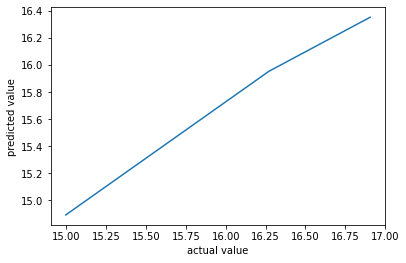

In [54]:
plt.plot(y_test, y_pred)
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

# Machine Learning (Classification)


## Dataset Background
Cardiovascular diseases (CVDs) are the number 1 cause of death globally, taking an estimated 17.9 million lives each year, which accounts for 31% of all deaths worldwide. Four out of 5CVD deaths are due to heart attacks and strokes, and one-third of these deaths occur prematurely in people under 70 years of age. Heart failure is a common event caused by CVDs and this dataset contains 11 features that can be used to predict a possible heart disease.

People with cardiovascular disease or who are at high cardiovascular risk (due to the presence of one or more risk factors such as hypertension, diabetes, hyperlipidaemia or already established disease) need early detection and management wherein a machine learning model can be of great help.

You can downlad the dataset via [this](https://www.kaggle.com/datasets/fedesoriano/heart-failure-prediction) 

## Description of the Features
1. Age: age of the patient [years]
2. Sex: sex of the patient [M: Male, F: Female]
3. ChestPainType: chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic]
4. RestingBP: resting blood pressure [mm Hg]
5. Cholesterol: serum cholesterol [mm/dl]
6. FastingBS: fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]
7. RestingECG: resting electrocardiogram results [Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria]
8. MaxHR: maximum heart rate achieved [Numeric value between 60 and 202]
9. ExerciseAngina: exercise-induced angina [Y: Yes, N: No]
10. Oldpeak: oldpeak = ST [Numeric value measured in depression]
11. ST_Slope: the slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping]
12. HeartDisease: output class [1: heart disease, 0: Normal]

## Source
This dataset was created by combining different datasets already available independently but not combined before. In this dataset, 5 heart datasets are combined over 11 common features which makes it the largest heart disease dataset available so far for research purposes. The five datasets used for its curation are:

- Cleveland: 303 observations
- Hungarian: 294 observations
- Switzerland: 123 observations
- Long Beach VA: 200 observations
- Stalog (Heart) Data Set: 270 observations
- Total: 1190 observations
- Duplicated: 272 observations

Final dataset: 918 observations

## Acknowledgements
Creators:

1. Hungarian Institute of Cardiology. Budapest: Andras Janosi, M.D.
2. University Hospital, Zurich, Switzerland: William Steinbrunn, M.D.
3. University Hospital, Basel, Switzerland: Matthias Pfisterer, M.D.
4. V.A. Medical Center, Long Beach and Cleveland Clinic Foundation: Robert Detrano, M.D., Ph.D.

In [55]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import roc_auc_score 
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier

In [56]:
df_heart = pd.read_csv('/content/drive/MyDrive/heart (1).csv')
df_heart

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.2,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.4,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.2,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.0,Flat,1


In [57]:
df_heart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [58]:
df_heart.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


In [59]:
!pip install --upgrade category_encoders #package installation for catergory_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [60]:
import category_encoders as ce

In [61]:
ce_ordinal = ce.OrdinalEncoder(cols=['Sex',	'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope'])
df_heart = ce_ordinal.fit_transform(df_heart)
df_heart

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,1,1,140,289,0,1,172,1,0.0,1,0
1,49,2,2,160,180,0,1,156,1,1.0,2,1
2,37,1,1,130,283,0,2,98,1,0.0,1,0
3,48,2,3,138,214,0,1,108,2,1.5,2,1
4,54,1,2,150,195,0,1,122,1,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,1,4,110,264,0,1,132,1,1.2,2,1
914,68,1,3,144,193,1,1,141,1,3.4,2,1
915,57,1,3,130,131,0,1,115,2,1.2,2,1
916,57,2,1,130,236,0,3,174,1,0.0,2,1


In [62]:
#chacking the count to see if the class is balanced or not
df_heart['HeartDisease'].value_counts()

1    508
0    410
Name: HeartDisease, dtype: int64

In [63]:
df_heart_original = df_heart.copy()

In [64]:
profile = ProfileReport(df_heart)
profile.to_notebook_iframe ()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

After data profiling, we decided to drop the 'ChestPainType' and 'ST_Slope' becasue they are highly correlated with the class.

As you will see below, we made a comparison before cleaning (modifying) the dataset and after cleaning (modifying) the dataset to see the difference and comment on it

In [65]:
df_heart = df_heart.drop(['ChestPainType', 'ST_Slope'], axis = 1)
df_heart

,Age,Sex,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,HeartDisease
0,40,1,140,289,0,1,172,1,0.0,0
1,49,2,160,180,0,1,156,1,1.0,1
2,37,1,130,283,0,2,98,1,0.0,0
3,48,2,138,214,0,1,108,2,1.5,1
4,54,1,150,195,0,1,122,1,0.0,0
...,...,...,...,...,...,...,...,...,...,...
913,45,1,110,264,0,1,132,1,1.2,1
914,68,1,144,193,1,1,141,1,3.4,1
915,57,1,130,131,0,1,115,2,1.2,1
916,57,2,130,236,0,3,174,1,0.0,1


### Splitting values for the models after cleaning

In [66]:
# splitting the values for the models 
x = df_heart.iloc[:,:9] #all the features except for the class
y = df_heart.iloc[:,9] # the class
X_train, X_test, y_train, y_test = train_test_split(
x, y, test_size=0.25, random_state=28)

## Creating Functions that Create Claddification Models

In [67]:
# A function to run a randomForests model
def run_randomForests(X_train, X_test, y_train, y_test):
    rf = RandomForestClassifier(n_estimators=200, random_state=39, max_depth=4)
    rf.fit(X_train, y_train)
    print('Train Set')
    pred = rf.predict_proba(X_train)
    print("Train Results roc-auc {}".format(roc_auc_score(y_train, pred[:,1])))
    print('Test Set')
    pred= rf.predict_proba(X_test)
    print("Test Results roc-auc {}".format(roc_auc_score(y_test, pred[:,1])))

In [68]:
# A function to run an LGBMC model
def run_LGBM(X_train, X_test, y_train, y_test):
   model = LGBMClassifier()
   model.fit(X_train, y_train)
   print('Train Set')
   pred = model.predict(X_train)
   print("Train Results f1_score: ", f1_score(y_train, pred))
   print('Test Set')
   pred= model.predict(X_test)
   print("Test Results f1_score: ", f1_score(y_test, pred))

In [69]:
# A function to run an LDA model
def run_LDA(X_train, X_test, y_train, y_test):
   model = LinearDiscriminantAnalysis()
   model.fit(X_train, y_train)
   print('Train Set')
   pred = model.predict(X_train)
   print("Train Results f1_score: ", f1_score(y_train, pred))
   print('Test Set')
   pred= model.predict(X_test)
   print("Test Results f1_score: ", f1_score(y_test, pred))

In [70]:
def run_GBC(X_train, X_test, y_train, y_test):
   model = GradientBoostingClassifier()
   model.fit(X_train, y_train)
   print('Train Set')
   pred = model.predict(X_train)
   print("Train Results f1_score: ", f1_score(y_train, pred))
   print('Test Set')
   pred= model.predict(X_test)
   print("Test Results f1_score: ", f1_score(y_test, pred))

In [71]:
def run_ADA(X_train, X_test, y_train, y_test):
   model = AdaBoostClassifier()
   model.fit(X_train, y_train)
   print('Train Set')
   pred = model.predict(X_train)
   print("Train Results f1_score: ", f1_score(y_train, pred))
   print('Test Set')
   pred= model.predict(X_test)
   print("Test Results f1_score: ", f1_score(y_test, pred))

## Running the Functions after Cleaning

In [72]:
run_LGBM(X_train, X_test, y_train, y_test)

Train Set
Train Results f1_score:  1.0
Test Set
Test Results f1_score:  0.8089887640449439


In [73]:
run_randomForests(X_train, X_test, y_train, y_test)

Train Set
Train Results roc-auc 0.921367412140575
Test Set
Test Results roc-auc 0.8972172699790714


In [74]:
run_LDA(X_train, X_test, y_train, y_test)

Train Set
Train Results f1_score:  0.8265582655826559
Test Set
Test Results f1_score:  0.844106463878327


In [75]:
run_GBC(X_train, X_test, y_train, y_test)

Train Set
Train Results f1_score:  0.9186991869918698
Test Set
Test Results f1_score:  0.8421052631578947


In [76]:
run_ADA(X_train, X_test, y_train, y_test)

Train Set
Train Results f1_score:  0.8548168249660788
Test Set
Test Results f1_score:  0.8270676691729322


## Running the Models Manually after cleaning the dataset

### **Random Forests**

In [77]:
RF= RandomForestClassifier()
RF.fit(X_train, y_train)
y_pred = RF.predict(X_test)

In [78]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.78      0.78        97
           1       0.84      0.83      0.83       133

    accuracy                           0.81       230
   macro avg       0.80      0.81      0.80       230
weighted avg       0.81      0.81      0.81       230



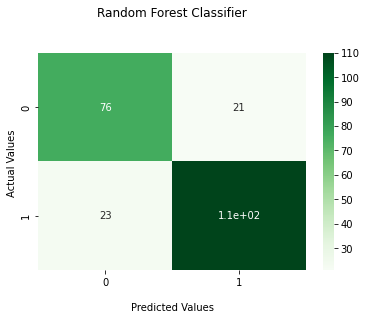

In [79]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(confusion_matrix, annot=True, cmap='Greens')
ax.set_title('Random Forest Classifier\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['0','1'])
ax.yaxis.set_ticklabels(['0','1'])
plt.show()

In [80]:
ps1 = precision_score(y_test, y_pred)
rs1 = recall_score(y_test, y_pred)
f1s1 = f1_score(y_test, y_pred)
print("Precision: ",ps1)
print("Recall: ",rs1)
print("F1-score: ",f1s1)

Precision:  0.8396946564885496
Recall:  0.8270676691729323
F1-score:  0.8333333333333333


### **Gradient Boosting Classifier**

In [81]:
gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)
y_pred = gbc.predict(X_test)

In [82]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.78      0.78      0.78        97
           1       0.84      0.84      0.84       133

    accuracy                           0.82       230
   macro avg       0.81      0.81      0.81       230
weighted avg       0.82      0.82      0.82       230



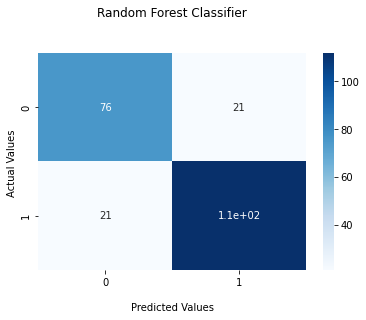

In [83]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(confusion_matrix, annot=True, cmap='Blues')
ax.set_title('Random Forest Classifier\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['0','1'])
ax.yaxis.set_ticklabels(['0','1'])
plt.show()

In [84]:
ps2 = precision_score(y_test, y_pred)
rs2 = recall_score(y_test, y_pred)
f1s2 = f1_score(y_test, y_pred)
print("Precision: ",ps2)
print("Recall: ",rs2)
print("F1-score: ",f1s2)

Precision:  0.8421052631578947
Recall:  0.8421052631578947
F1-score:  0.8421052631578947


### **Linear Discriminant Analysis**

In [85]:
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
y_pred = lda.predict(X_test)

In [86]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.78      0.80      0.79        97
           1       0.85      0.83      0.84       133

    accuracy                           0.82       230
   macro avg       0.82      0.82      0.82       230
weighted avg       0.82      0.82      0.82       230



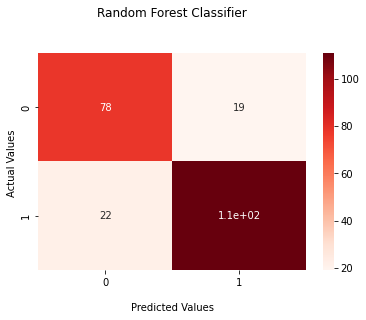

In [87]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(confusion_matrix, annot=True, cmap='Reds')
ax.set_title('Random Forest Classifier\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['0','1'])
ax.yaxis.set_ticklabels(['0','1'])
plt.show()

In [88]:
ps3 = precision_score(y_test, y_pred)
rs3 = recall_score(y_test, y_pred)
f1s3 = f1_score(y_test, y_pred)
print("Precision: ",ps3)
print("Recall: ",rs3)
print("F1-score: ",f1s3)

Precision:  0.8538461538461538
Recall:  0.8345864661654135
F1-score:  0.844106463878327


### **Ada Boost Classifier**


In [89]:
ada = AdaBoostClassifier()
ada.fit(X_train, y_train)
y_pred = ada.predict(X_test)

In [90]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.76      0.76      0.76        97
           1       0.83      0.83      0.83       133

    accuracy                           0.80       230
   macro avg       0.79      0.79      0.79       230
weighted avg       0.80      0.80      0.80       230



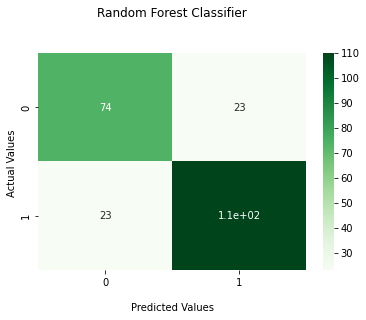

In [91]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(confusion_matrix, annot=True, cmap='Greens')
ax.set_title('Random Forest Classifier\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['0','1'])
ax.yaxis.set_ticklabels(['0','1'])
plt.show()

In [92]:
ps4 = precision_score(y_test, y_pred)
rs4 = recall_score(y_test, y_pred)
f1s4 = f1_score(y_test, y_pred)
print("Precision: ",ps4)
print("Recall: ",rs4)
print("F1-score: ",f1s4)

Precision:  0.8270676691729323
Recall:  0.8270676691729323
F1-score:  0.8270676691729322


## Splitting values for the models for the original dataset

In [93]:
# splitting the values for the models 
x = df_heart_original.iloc[:,:11] #all the features except for the class
y = df_heart_original.iloc[:,11] # the class
X_train, X_test, y_train, y_test = train_test_split(
x, y, test_size=0.25, random_state=28)

## Running the functions for the original data

In [94]:
run_LGBM(X_train, X_test, y_train, y_test)

Train Set
Train Results f1_score:  1.0
Test Set
Test Results f1_score:  0.8712121212121212


In [95]:
run_randomForests(X_train, X_test, y_train, y_test)

Train Set
Train Results roc-auc 0.9534653887113951
Test Set
Test Results roc-auc 0.9389969769785288


In [96]:
run_LDA(X_train, X_test, y_train, y_test)

Train Set
Train Results f1_score:  0.8657894736842104
Test Set
Test Results f1_score:  0.8872180451127819


In [97]:
run_GBC(X_train, X_test, y_train, y_test)

Train Set
Train Results f1_score:  0.9656992084432716
Test Set
Test Results f1_score:  0.8957528957528956


In [98]:
run_ADA(X_train, X_test, y_train, y_test)

Train Set
Train Results f1_score:  0.9035667107001322
Test Set
Test Results f1_score:  0.8803088803088803


## Running the Models Manually for the original dataset without modifying

### **RandomForests**

In [99]:
RF= RandomForestClassifier()
RF.fit(X_train, y_train)
y_pred = RF.predict(X_test)

In [100]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.84      0.85        97
           1       0.88      0.90      0.89       133

    accuracy                           0.87       230
   macro avg       0.87      0.87      0.87       230
weighted avg       0.87      0.87      0.87       230



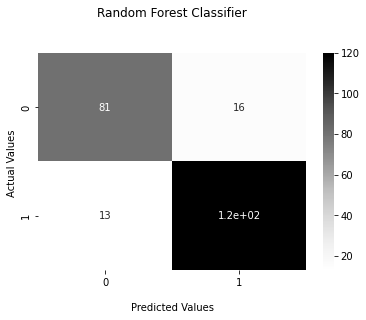

In [101]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(confusion_matrix, annot=True, cmap='Greys')
ax.set_title('Random Forest Classifier\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['0','1'])
ax.yaxis.set_ticklabels(['0','1'])
plt.show()

In [102]:
ps5 = precision_score(y_test, y_pred)
rs5 = recall_score(y_test, y_pred)
f1s5 = f1_score(y_test, y_pred)
print("Precision: ",ps5)
print("Recall: ",rs5)
print("F1-score: ",f1s5)

Precision:  0.8823529411764706
Recall:  0.9022556390977443
F1-score:  0.8921933085501859


### **Gradient Boosting Classifier**

In [103]:
gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)
y_pred = gbc.predict(X_test)

In [104]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.90      0.87        97
           1       0.92      0.87      0.90       133

    accuracy                           0.88       230
   macro avg       0.88      0.88      0.88       230
weighted avg       0.89      0.88      0.88       230



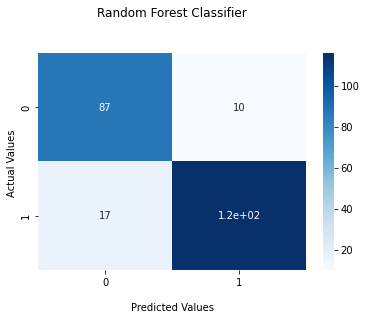

In [105]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(confusion_matrix, annot=True, cmap='Blues')
ax.set_title('Random Forest Classifier\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['0','1'])
ax.yaxis.set_ticklabels(['0','1'])
plt.show()

In [106]:
ps6 = precision_score(y_test, y_pred)
rs6 = recall_score(y_test, y_pred)
f1s6 = f1_score(y_test, y_pred)
print("Precision: ",ps6)
print("Recall: ",rs6)
print("F1-score: ",f1s6)

Precision:  0.9206349206349206
Recall:  0.8721804511278195
F1-score:  0.8957528957528956


### **Linear Discriminant Analysis**

In [107]:
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
y_pred = lda.predict(X_test)

In [108]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85        97
           1       0.89      0.89      0.89       133

    accuracy                           0.87       230
   macro avg       0.87      0.87      0.87       230
weighted avg       0.87      0.87      0.87       230



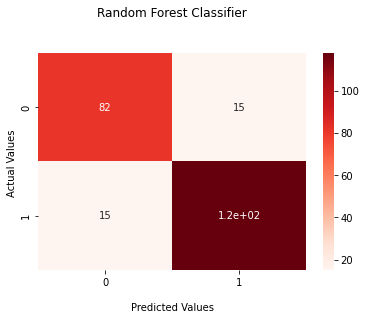

In [109]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(confusion_matrix, annot=True, cmap='Reds')
ax.set_title('Random Forest Classifier\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['0','1'])
ax.yaxis.set_ticklabels(['0','1'])
plt.show()

In [110]:
ps7 = precision_score(y_test, y_pred)
rs7 = recall_score(y_test, y_pred)
f1s7 = f1_score(y_test, y_pred)
print("Precision: ",ps7)
print("Recall: ",rs7)
print("F1-score: ",f1s7)

Precision:  0.8872180451127819
Recall:  0.8872180451127819
F1-score:  0.8872180451127819


### **Ada Boost Classifier**

In [111]:
ada = AdaBoostClassifier()
ada.fit(X_train, y_train)
y_pred = ada.predict(X_test)

In [112]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.88      0.85        97
           1       0.90      0.86      0.88       133

    accuracy                           0.87       230
   macro avg       0.86      0.87      0.86       230
weighted avg       0.87      0.87      0.87       230



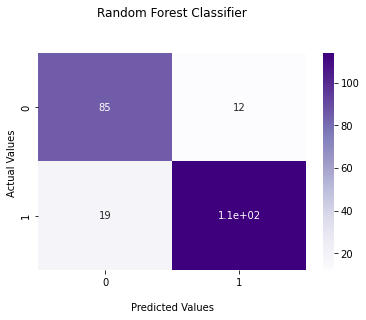

In [113]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(confusion_matrix, annot=True, cmap='Purples')
ax.set_title('Random Forest Classifier\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['0','1'])
ax.yaxis.set_ticklabels(['0','1'])
plt.show()

In [114]:
ps8 = precision_score(y_test, y_pred)
rs8 = recall_score(y_test, y_pred)
f1s8 = f1_score(y_test, y_pred)
print("Precision: ",ps8)
print("Recall: ",rs8)
print("F1-score: ",f1s8)

Precision:  0.9047619047619048
Recall:  0.8571428571428571
F1-score:  0.8803088803088803


## Creating a Dataframe for the resutls

In [115]:
results_df = pd.DataFrame({'Modles': ['Random Forests','Gradient Boosting Classifier', 'Linear Discriminant Analysis',
                                       'Ada Boost Classifier'], 'precision_score (before modification)':[ps5,ps6,ps7,ps8],
                                       'recall_score (before modification)': [rs5,rs6,rs7,rs8], 
                                       'F1-score (before modification)': [f1s5, f1s6, f1s7, f1s8],
                                       'precision_score (after modification)':[ps1,ps2,ps3,ps4],
                                       'recall_score  (after modification)': [rs1,rs2,rs3,rs4], 
                                       'F1-score (after modification)': [f1s1, f1s2, f1s3, f1s4]})
results_df

,Modles,precision_score (before modification),recall_score (before modification),F1-score (before modification),precision_score (after modification),recall_score (after modification),F1-score (after modification)
0,Random Forests,0.882353,0.902256,0.892193,0.839695,0.827068,0.833333
1,Gradient Boosting Classifier,0.920635,0.872180,0.895753,0.842105,0.842105,0.842105
2,Linear Discriminant Analysis,0.887218,0.887218,0.887218,0.853846,0.834586,0.844106
3,Ada Boost Classifier,0.904762,0.857143,0.880309,0.827068,0.827068,0.827068


As you can see above, the "Cleaning" did not actually help give us better results which explains why we always need to try. This might have happened due to very little data and this technique would probably help with more data.
The only reason to remove highly correlated features (which is what we did) is storage and speed concerns. Other than that, what matters about features is whether they contribute to prediction, and whether their data quality is sufficient. 

## The Best Results Dataframe

In [116]:
results_df_final = pd.DataFrame({'Modles': ['Random Forests','Gradient Boosting Classifier', 'Linear Discriminant Analysis',
                                       'Ada Boost Classifier'], 'precision_score':[ps5,ps6,ps7,ps8],
                                       'recall_score': [rs5,rs6,rs7,rs8], 
                                       'F1-score': [f1s5, f1s6, f1s7, f1s8]})
results_df_final

,Modles,precision_score,recall_score,F1-score
0,Random Forests,0.882353,0.902256,0.892193
1,Gradient Boosting Classifier,0.920635,0.872180,0.895753
2,Linear Discriminant Analysis,0.887218,0.887218,0.887218
3,Ada Boost Classifier,0.904762,0.857143,0.880309
